### Project 3


#### Credit card payment defualt prediction

To classify if the credit card holder will defualt or not 





- Data acquistion
- EDA
- Modeling
 
   - Logistic Regression - Soft classifiction predict yes not but with % probability
   - Deciscion Tree
   - Random Forest
   - Naive Bayes

- Tune the best Model


In [3]:
import numpy as np
import pandas as pd
import pickle

import seaborn as sns
import matplotlib.pyplot as plt
import sys

%matplotlib inline

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, accuracy_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import LinearSVC, SVC
from xgboost import XGBClassifier
from collections import Counter


from mlxtend.plotting import plot_decision_regions
from imblearn.over_sampling import SMOTE
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix, classification_report 

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier




# make prettier plots
%config InlineBackend.figure_format = 'svg' 




### EDA

In [4]:
# Load the data 


credit_data = pd.read_csv('UCI_Credit_card.csv')


credit_data.to_pickle('./credit_data.pkl')
    
    


In [5]:
df_credit_data = pd.read_pickle('./credit_data.pkl')
df_credit_data.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [4]:
# Check the if there is any missing data. Looks good no missing data
df_credit_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [5]:
df_credit_data.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


In [6]:
# Change the column names for consistency

df_credit_data = df_credit_data.rename(columns={'PAY_0':'PAY_1','default.payment.next.month':'DEF_PAYMENT' })



df_credit_data




,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEF_PAYMENT
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000.0,1,3,1,39,0,0,0,0,...,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0
29996,29997,150000.0,1,3,2,43,-1,-1,-1,-1,...,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0
29997,29998,30000.0,1,2,2,37,4,3,2,-1,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1
29998,29999,80000.0,1,3,1,41,1,-1,0,0,...,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0,1


In [7]:
#Check unique values and see if need to make any changes 

print(df_credit_data.SEX.unique())
print(df_credit_data.EDUCATION.unique())
print(df_credit_data.MARRIAGE.unique())




[2 1]
[2 1 3 5 4 6 0]
[1 2 3 0]


In [8]:
#Check the age range and create bucket for later use (feature engineering)

print(df_credit_data.AGE.unique())




[24 26 34 37 57 29 23 28 35 51 41 30 49 39 40 27 47 33 32 54 58 22 25 31
 46 42 43 45 56 44 53 38 63 36 52 48 55 60 50 75 61 73 59 21 67 66 62 70
 72 64 65 71 69 68 79 74]


In [9]:
# Changed Education 0 and 6 values to 5 since I think all unknown values should be together in same category as Unknown
# Combined Marriage 0 to 3. 3 = Others.  

fill = (df_credit_data.EDUCATION == 0) | (df_credit_data.EDUCATION == 6) | (df_credit_data.EDUCATION == 6)
df_credit_data.loc[fill, 'EDUCATION'] = 5

fill = (df_credit_data.MARRIAGE == 0) 
df_credit_data.loc[fill, 'MARRIAGE'] = 3

In [10]:
#Check if values changed

print(df_credit_data.EDUCATION.unique())
print(df_credit_data.MARRIAGE.unique())

[2 1 3 5 4]
[1 2 3]


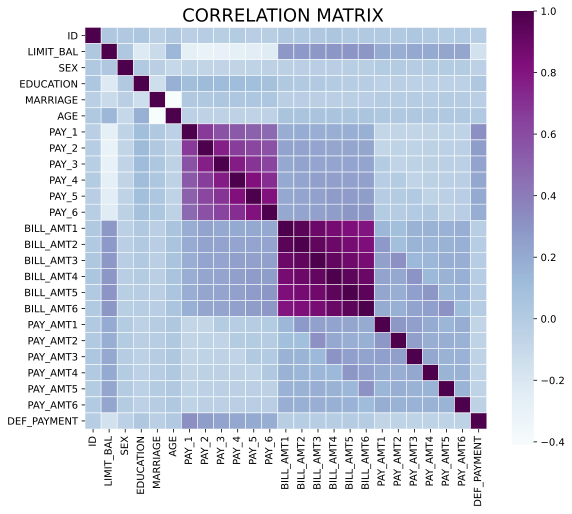

In [11]:
"""check correlation between features to see if there is colinerity. Below map shows 
BILL_ and PAY columns are colinear with DEF_PAYMENT."""  

corr = df_credit_data.corr()
f,ax = plt.subplots(figsize=(9, 8))
sns.heatmap(corr, cbar = True,  square = True, annot = False, fmt= '.f', 
            xticklabels= True, yticklabels= True
            ,cmap="BuPu", linewidths=.5, ax=ax)
plt.title('CORRELATION MATRIX ', size=18);

plt.savefig('Correlation_Matrix')

In [12]:
df_credit_data.corr()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEF_PAYMENT
ID,1.000000,0.026179,0.018497,0.039718,-0.028208,0.018678,-0.030575,-0.011215,-0.018494,-0.002735,...,0.040351,0.016705,0.016730,0.009742,0.008406,0.039151,0.007793,0.000652,0.003000,-0.013952
LIMIT_BAL,0.026179,1.000000,0.024755,-0.219365,-0.111012,0.144713,-0.271214,-0.296382,-0.286123,-0.267460,...,0.293988,0.295562,0.290389,0.195236,0.178408,0.210167,0.203242,0.217202,0.219595,-0.153520
SEX,0.018497,0.024755,1.000000,0.013691,-0.028522,-0.090874,-0.057643,-0.070771,-0.066096,-0.060173,...,-0.021880,-0.017005,-0.016733,-0.000242,-0.001391,-0.008597,-0.002229,-0.001667,-0.002766,-0.039961
EDUCATION,0.039718,-0.219365,0.013691,1.000000,-0.131816,0.175499,0.105193,0.120662,0.113370,0.108355,...,-0.002208,-0.009384,-0.010872,-0.038229,-0.029372,-0.039936,-0.038786,-0.042082,-0.039017,0.026969
MARRIAGE,-0.028208,-0.111012,-0.028522,-0.131816,1.000000,-0.412001,0.018557,0.023620,0.032399,0.031831,...,-0.027274,-0.029270,-0.025066,-0.004653,-0.009513,-0.004250,-0.013970,-0.003019,-0.008383,-0.027575
AGE,0.018678,0.144713,-0.090874,0.175499,-0.412001,1.000000,-0.039447,-0.050148,-0.053048,-0.049722,...,0.051353,0.049345,0.047613,0.026147,0.021785,0.029247,0.021379,0.022850,0.019478,0.013890
PAY_1,-0.030575,-0.271214,-0.057643,0.105193,0.018557,-0.039447,1.000000,0.672164,0.574245,0.538841,...,0.179125,0.180635,0.176980,-0.079269,-0.070101,-0.070561,-0.064005,-0.058190,-0.058673,0.324794
PAY_2,-0.011215,-0.296382,-0.070771,0.120662,0.023620,-0.050148,0.672164,1.000000,0.766552,0.662067,...,0.222237,0.221348,0.219403,-0.080701,-0.058990,-0.055901,-0.046858,-0.037093,-0.036500,0.263551
PAY_3,-0.018494,-0.286123,-0.066096,0.113370,0.032399,-0.053048,0.574245,0.766552,1.000000,0.777359,...,0.227202,0.225145,0.222327,0.001295,-0.066793,-0.053311,-0.046067,-0.035863,-0.035861,0.235253
PAY_4,-0.002735,-0.267460,-0.060173,0.108355,0.031831,-0.049722,0.538841,0.662067,0.777359,1.000000,...,0.245917,0.242902,0.239154,-0.009362,-0.001944,-0.069235,-0.043461,-0.033590,-0.026565,0.216614


In [13]:
# Count target value class proportion 


df_credit_data.DEF_PAYMENT.value_counts() 

0    23364
1     6636
Name: DEF_PAYMENT, dtype: int64

In [14]:
# Conver the target value porportion to percentage 


YES = df_credit_data.DEF_PAYMENT.sum()
NO = len(df_credit_data)-YES

Percentage_Of_default = round(YES/len(df_credit_data)*100,2)
Percentage_Non_default = round(NO/len(df_credit_data)*100,2)



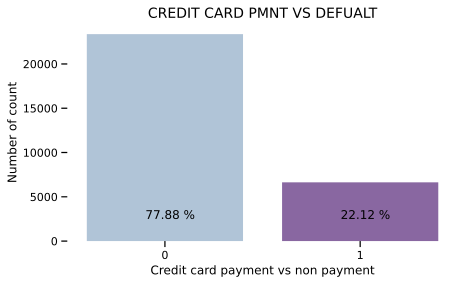

In [15]:
#plot the target class porportion which shows there is class imbalance

plt.figure(figsize=(7,4))
sns.set_context('notebook')
sns.countplot('DEF_PAYMENT', data=df_credit_data, palette="BuPu")
plt.annotate(str(Percentage_Non_default)+" %", xy=(-0.5, 15000), xytext=(-0.1, 2500),  size=12)
plt.annotate(str(Percentage_Of_default)+" %", xy=(0.5, 15000), xytext=(0.9, 2500), size=12)
plt.title('CREDIT CARD PMNT VS DEFUALT', size=14)
plt.ylabel('Number of count')
plt.xlabel('Credit card payment vs non payment')



plt.box(False);
plt.savefig('Credit_card_vs_Defualt')

No handles with labels found to put in legend.


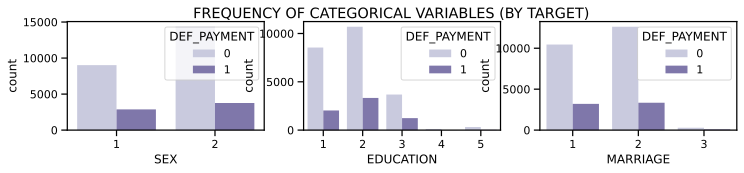

In [16]:
#plot relationship of the categorical values 

plot = df_credit_data
f, axes = plt.subplots(1, 3,figsize=(12,2), facecolor='white')
f.suptitle('FREQUENCY OF CATEGORICAL VARIABLES (BY TARGET)')

ax.legend(ncol=.2, loc="upper right", frameon=False);
ax1 = sns.countplot(x="SEX", hue="DEF_PAYMENT", data=plot, palette="Purples", ax=axes[0])

ax2 = sns.countplot(x="EDUCATION", hue="DEF_PAYMENT", data=plot, palette="Purples",ax=axes[1])

ax3 = sns.countplot(x="MARRIAGE", hue="DEF_PAYMENT", data=plot, palette="Purples",ax=axes[2],)

plt.savefig('Frequency_of_categorical_Variables')



In [17]:
#more data analysis 
df_credit_data.groupby('DEF_PAYMENT').mean()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
DEF_PAYMENT,,,,,,,,,,,,,,,,,,,,,
0,15064.893982,178099.726074,1.614150,1.842493,1.564929,35.417266,-0.211222,-0.301917,-0.316256,-0.355633,...,47533.365605,43611.165254,40530.445343,39042.268704,6307.337357,6640.465074,5753.496833,5300.529319,5248.220296,5719.371769
1,14773.781947,130109.656420,1.567058,1.893460,1.530289,35.725738,0.668174,0.458258,0.362116,0.254521,...,45181.598855,42036.950573,39540.190476,38271.435503,3397.044153,3388.649638,3367.351567,3155.626733,3219.139542,3441.482068


In [18]:
df_credit_data.groupby('SEX').mean()

,ID,LIMIT_BAL,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEF_PAYMENT
SEX,,,,,,,,,,,,,,,,,,,,,
1,14802.770104,163519.825034,1.840511,1.575622,36.519431,0.063257,-0.029189,-0.068557,-0.133832,-0.189182,...,45000.331090,41587.504963,40101.775320,5668.537264,5960.720138,5412.506057,4869.177995,4830.827052,5276.196753,0.241672
2,15130.282078,170086.462014,1.862467,1.545219,34.806868,-0.069181,-0.202407,-0.230289,-0.277661,-0.316751,...,42122.600099,39473.816807,38064.427286,5660.327076,5895.200088,5103.057255,4797.786992,4778.752043,5175.665305,0.207763


In [19]:
df_credit_data.groupby('EDUCATION').mean()

,ID,LIMIT_BAL,SEX,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEF_PAYMENT
EDUCATION,,,,,,,,,,,,,,,,,,,,,
1,14697.212187,212956.069910,1.588663,1.653472,34.231838,-0.233916,-0.408125,-0.425886,-0.461974,-0.479074,...,42931.065187,40388.891261,38668.076051,6780.933585,7306.622201,6560.585735,5804.565612,5776.562211,6422.554842,0.192348
2,15024.237776,147062.437634,1.616964,1.524305,34.722096,0.102210,0.022523,-0.018532,-0.083036,-0.141411,...,44748.779758,41588.566287,40431.943835,5080.463293,5106.711333,4556.800000,4375.387313,4452.678689,4716.487028,0.237349
3,15342.314013,126550.270490,1.595282,1.448037,40.299980,0.132805,0.040879,0.002644,-0.066504,-0.139313,...,38718.582266,35957.469392,34704.597315,4866.397397,5053.454139,3964.056742,3992.658532,3599.658938,3825.749034,0.251576
4,18143.447154,220894.308943,1.658537,1.601626,33.853659,-0.504065,-0.772358,-0.764228,-0.813008,-0.780488,...,39570.268293,33840.113821,32136.130081,5450.512195,6555.008130,9990.626016,5104.861789,5991.642276,4284.967480,0.056911
5,17348.263768,167205.797101,1.628986,1.486957,36.959420,-0.144928,-0.333333,-0.397101,-0.400000,-0.434783,...,59105.368116,50355.997101,43466.104348,6532.881159,8675.504348,7752.542029,4911.579710,5591.713043,8613.802899,0.075362


In [20]:
df_credit_data.groupby('MARRIAGE').mean()

,ID,LIMIT_BAL,SEX,EDUCATION,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEF_PAYMENT
MARRIAGE,,,,,,,,,,,,,,,,,,,,,
1,15253.288821,182200.893184,1.620031,1.984552,40.016692,-0.036752,-0.163262,-0.206238,-0.259243,-0.308441,...,44891.819094,41975.121824,40250.686946,5789.741562,6205.714401,5328.491983,5075.922469,4836.070503,5331.664836,0.234717
2,14807.277813,156413.660737,1.589514,1.731270,31.452706,-0.002819,-0.111000,-0.135680,-0.191118,-0.232085,...,42194.771674,39207.970120,37974.720308,5523.197194,5648.984465,5123.063518,4612.971185,4781.813581,5162.734340,0.209283
3,14023.726790,103076.923077,1.615385,2.302387,42.084881,0.122016,-0.029178,-0.007958,-0.074271,-0.180371,...,29479.514589,26758.103448,26897.198939,7037.175066,7137.039788,5846.119363,4797.901857,4214.509284,3241.315650,0.236074


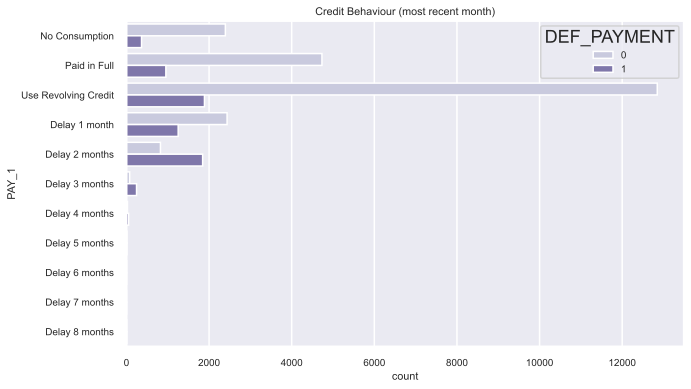

In [21]:
# Understaning of last months pmnt behavior 
sns.set(rc={'figure.figsize':(10,6)})
sns.set_context("talk", font_scale=0.6)

pay1 = sns.countplot(y="PAY_1", hue='DEF_PAYMENT', data=df_credit_data, palette="Purples")
pay1.set_yticklabels(['No Consumption','Paid in Full','Use Revolving Credit',
                      'Delay 1 month','Delay 2 months'
                     ,'Delay 3 months','Delay 4 months','Delay 5 months',
                      'Delay 6 months','Delay 7 months','Delay 8 months'])
pay1.set_title('Credit Behaviour (most recent month)')

# plt.box(False);
plt.show()


In [22]:
#To see if there is any relationshp between Bill and pmnt 
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

ax = sns.scatterplot(x="BILL_AMT1", y='PAY_AMT1', hue="DEF_PAYMENT", data=df_credit_data)



In [23]:
#To see if there is any relationshp between Bill and LimitBalance 


ax = sns.scatterplot(x="BILL_AMT1", y="LIMIT_BAL", hue="DEF_PAYMENT",
                     data=df_credit_data, )

### Data Imbalance

In [24]:
# Turns our data is imbalanced. Counting the class values for our target data and split our data 
#porpotionaly train dataset and test dataset

df_credit_data = df_credit_data[df_credit_data['DEF_PAYMENT'].isin(['0','1'])]

def get_class_counts(df):
    grp =df.groupby(['DEF_PAYMENT'])['ID'].nunique()
    return {key:grp[key] for key in list(grp.keys())}


def get_class_proportions(df):
    class_counts = get_class_counts(df)
    return{val[0]: round (val[1]/df.shape[0],4) for val in class_counts.items()}
                                     
                                     
print("Class counts: 0 Non-Defaul and 1 Defualt", get_class_counts(df_credit_data))
print("Class prop 0 Non-Defaul and 1 Defualt", get_class_proportions(df_credit_data))





Class counts: 0 Non-Defaul and 1 Defualt {0: 23364, 1: 6636}
Class prop 0 Non-Defaul and 1 Defualt {0: 0.7788, 1: 0.2212}


In [25]:
#proportion of the data Train vs test 

train, test = train_test_split(df_credit_data, test_size = 0.20, stratify = df_credit_data['DEF_PAYMENT'])

train_class_prop = get_class_proportions(train)
test_class_prop = get_class_proportions(test)

print("Train data class proportions", train_class_prop)
print("Test data class proportions", test_class_prop)
print(len(train))
print(len(test))


Train data class proportions {0: 0.7788, 1: 0.2212}
Test data class proportions {0: 0.7788, 1: 0.2212}
24000
6000


In [26]:
# Helper function for printing confusion matrices



def print_confusion_matrix(confusion_matrix, class_names, color="purple"):
  
    df_cm = pd.DataFrame(confusion_matrix, index=class_names, columns=class_names, )
  
    try:
        heatmap = sns.heatmap(df_cm, annot=True, fmt="d")
        plt.title('CREDIT CARD PMNT VS DEFUALT CONFUSION METRICS', size=10)
        plt.ylabel('Number of count')
        plt.xlabel('Credit card payment vs non payment')
    except ValueError:
        raise ValueError("Confusion matrix values must be integers.")
    
    return df_cm

In [27]:
imbalanced_df = train
target_count = imbalanced_df.DEF_PAYMENT.value_counts()


In [28]:
#As we saw it earlier / class imbalance 


print(f'Class 0: {target_count[0]}')
print(f'Class 1: {target_count[1]}')
print(f'Proportion: {round(target_count[0] / target_count[1], 2)} : 1')
print(f'Percentage of Majority Class: {round(target_count[0] / sum(target_count), 4)*100}')

Class 0: 18691
Class 1: 5309
Proportion: 3.52 : 1
Percentage of Majority Class: 77.88000000000001


In [29]:
X = imbalanced_df[['LIMIT_BAL','PAY_1']]

In [30]:
# X = imbalanced_df.iloc[:, 2:]
y = imbalanced_df.DEF_PAYMENT
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2, stratify=y)

In [31]:
X = np.array(X)
X_train = np.array(X_train)
X_test = np.array(X_test)
y_train = np.array(y_train)
y_test = np.array(y_test)
y = np.array(y)

In [32]:
clf = XGBClassifier().fit(X_train, y_train)

In [33]:
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Model Accuracy: {round(accuracy, 4)*100}')

Model Accuracy: 82.17


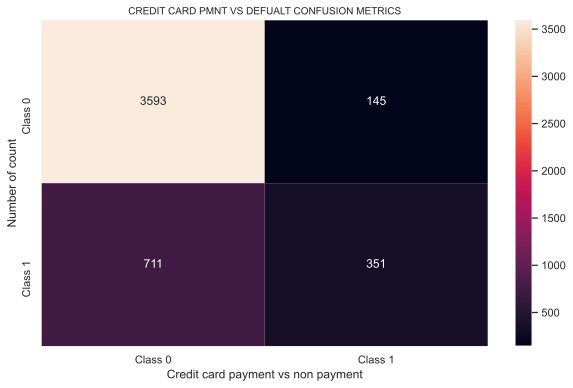

In [34]:
#Test out the confustion metrics before balancing our data 

conf_mat = confusion_matrix(y_true=y_test, y_pred=y_pred)
cm = print_confusion_matrix(conf_mat, ['Class 0', 'Class 1'])




plt.savefig('confusion_matrix_smaller_class')

# Total  4800 




#True Positives =  Class(0,0)
# True Negatives =  Class (1,1)

# False positives = will defualt Class(0,1) 
# False negative = will not defualt Class (1,0)


#Predicted No 4292
#Actual NO = 3738

# True Postive      False Negative
# False Positives   True Negative





In [35]:
# Use SMOTE Techniques 
X = imbalanced_df.drop(["DEF_PAYMENT"], axis=1)
y = imbalanced_df.DEF_PAYMENT



In [36]:
X.shape

(24000, 24)

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2, stratify=y)

In [38]:
#SMOTE 

from imblearn.over_sampling import SMOTE
X_smoted, y_smoted = SMOTE(random_state=42).fit_sample(X,y)


In [39]:
X_smoted.shape

(37382, 24)

In [40]:

X_train, X_test, y_train, y_test = train_test_split(X_smoted, y_smoted, test_size=0.2, random_state=2)


In [41]:
#Balanced Class

Counter(y_smoted)

Counter({0: 18691, 1: 18691})

In [42]:
X = np.array(X)
X_train = np.array(X_train)
X_test = np.array(X_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [43]:

clf_smote = SVC().fit(X_smoted, y_smoted)


In [44]:
X_smoted.shape

(37382, 24)

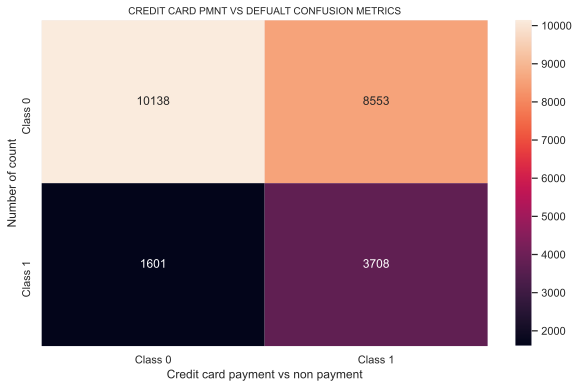

In [45]:
cm = print_confusion_matrix(confusion_matrix(y, clf_smote.predict(X)), ['Class 0', 'Class 1'])
plt.savefig('Confusion_matrix_after_SMOTE')